In [43]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [44]:
# Чтение базы
massiv_fx = pd.read_csv('massiv.csv')

In [45]:
massiv_fx

,Time,Open,Close,Low,High,RSI,MFI,MACD,Stochastik
0,2145,111.843,111.828,111.797,111.871,43.65,44.199,0.1425,13.57
1,2200,111.826,111.836,111.799,111.879,43.74,43.872,0.1443,13.60
2,2215,111.835,111.950,111.814,111.971,45.00,44.942,0.1443,13.73
3,2230,111.951,112.005,111.928,112.033,45.59,45.927,0.1428,13.94
4,2245,112.005,112.047,111.983,112.078,46.04,47.031,0.1405,14.18
...,...,...,...,...,...,...,...,...,...
99894,1245,118.115,118.100,118.088,118.167,44.43,49.984,0.0144,67.87
99895,1300,118.099,118.138,118.094,118.149,45.14,49.956,0.0205,67.50
99896,1315,118.137,118.134,118.112,118.191,45.08,50.000,0.0259,67.06
99897,1330,118.135,118.216,118.122,118.224,46.58,49.891,0.0300,66.81


In [46]:
massiv_fx_len = massiv_fx.shape[0] // 9
massiv_blok = 100 # Формируем матрицы для анализа 96*4*24

In [47]:
# Делим на базы
bd_train = massiv_fx[:massiv_fx_len * 6].reset_index(drop=True)
bd_test = massiv_fx[massiv_fx_len * 6 + massiv_blok * 2:massiv_fx_len * 8].reset_index(drop=True)
bd_val = massiv_fx[massiv_fx_len * 8 + massiv_blok * 2:].reset_index(drop=True)

In [48]:
bd_train
bd_test
bd_val

,Time,Open,Close,Low,High,RSI,MFI,MACD,Stochastik
0,1315,113.979,113.932,113.901,113.986,43.42,45.219,0.1042,16.14
1,1330,113.929,113.905,113.899,113.951,43.08,45.304,0.1053,16.19
2,1345,113.906,114.003,113.900,114.040,44.66,46.616,0.1050,16.34
3,1400,114.001,113.974,113.960,114.046,44.29,47.985,0.1045,16.58
4,1415,113.973,113.979,113.944,114.021,44.37,47.921,0.1042,16.86
...,...,...,...,...,...,...,...,...,...
10902,1245,118.115,118.100,118.088,118.167,44.43,49.984,0.0144,67.87
10903,1300,118.099,118.138,118.094,118.149,45.14,49.956,0.0205,67.50
10904,1315,118.137,118.134,118.112,118.191,45.08,50.000,0.0259,67.06
10905,1330,118.135,118.216,118.122,118.224,46.58,49.891,0.0300,66.81


Стандартизация

In [49]:
from sklearn.preprocessing import StandardScaler, RobustScaler

In [50]:
ss = RobustScaler()
bd_train_sc = ss.fit_transform(bd_train)
bd_test_sc = ss.fit_transform(bd_test)
bd_val_sc = ss.fit_transform(bd_val)

In [51]:
bd_train_sc[:100]

array([[ 7.87500000e-01,  9.09950366e-03,  5.55424250e-03,
         6.87040986e-03,  7.54716981e-03, -1.09773124e+00,
        -7.17366496e-01,  1.32242991e+00, -1.00408497e+00],
       [ 8.33333333e-01,  5.08154101e-03,  7.44504845e-03,
         7.34423122e-03,  9.43396226e-03, -1.08202443e+00,
        -7.55640088e-01,  1.33925234e+00, -1.00326797e+00],
       [ 8.45833333e-01,  7.20869771e-03,  3.43890333e-02,
         1.08978915e-02,  3.11320755e-02, -8.62129145e-01,
        -6.30402341e-01,  1.33925234e+00, -9.99727669e-01],
       [ 8.58333333e-01,  3.46253841e-02,  4.73883243e-02,
         3.79057095e-02,  4.57547170e-02, -7.59162304e-01,
        -5.15113387e-01,  1.32523364e+00, -9.94008715e-01],
       [ 8.70833333e-01,  4.73883243e-02,  5.73150555e-02,
         5.09357972e-02,  5.63679245e-02, -6.80628272e-01,
        -3.85896123e-01,  1.30373832e+00, -9.87472767e-01],
       [ 9.16666667e-01,  5.25880407e-02,  6.93689435e-02,
         6.04122246e-02,  6.39150943e-02, -5.881326

In [52]:
len(bd_train_sc)-massiv_blok-1

66493

In [53]:
# Создаем матрицы для обучения
X_train = []
Y_train = []
for col in range(len(bd_train_sc)-massiv_blok-1):
    X_train.append(bd_train_sc[col:col+massiv_blok])
    Y_train.append(bd_train_sc[col+massiv_blok,2])
#X_train = np.array(X_train)
#Y_train = np.array(Y_train)

In [54]:
# Создаем матрицы для тестирования
X_test = []
Y_test = []
for col in range(len(bd_test_sc)-massiv_blok-1):
    X_test.append(bd_test_sc[col:col+massiv_blok])
    Y_test.append(bd_test_sc[col+massiv_blok,2])
#X_test = np.array(X_test)
#Y_test = np.array(Y_test)[:,2]

In [55]:
# Создаем матрицы для валидации
X_val = []
Y_val = []
for col in range(len(bd_val_sc)-massiv_blok-1):
    X_val.append(bd_val_sc[col:col+massiv_blok])
    Y_val.append(bd_val_sc[col+massiv_blok,2])
#X_val = np.array(X_val)
#Y_val = np.array(Y_val)[:,2]

In [56]:
bd_train

,Time,Open,Close,Low,High,RSI,MFI,MACD,Stochastik
0,2145,111.843,111.828,111.797,111.871,43.65,44.199,0.1425,13.57
1,2200,111.826,111.836,111.799,111.879,43.74,43.872,0.1443,13.60
2,2215,111.835,111.950,111.814,111.971,45.00,44.942,0.1443,13.73
3,2230,111.951,112.005,111.928,112.033,45.59,45.927,0.1428,13.94
4,2245,112.005,112.047,111.983,112.078,46.04,47.031,0.1405,14.18
...,...,...,...,...,...,...,...,...,...
66589,1930,109.928,109.958,109.908,109.974,57.69,46.724,-0.0767,68.34
66590,1945,109.957,109.953,109.932,109.990,57.56,46.419,-0.0787,68.92
66591,2000,109.952,109.955,109.940,109.980,57.60,47.827,-0.0806,69.44
66592,2015,109.955,109.971,109.937,109.983,57.91,47.411,-0.0825,70.07


In [57]:
X_train

[array([[ 7.87500000e-01,  9.09950366e-03,  5.55424250e-03,
          6.87040986e-03,  7.54716981e-03, -1.09773124e+00,
         -7.17366496e-01,  1.32242991e+00, -1.00408497e+00],
        [ 8.33333333e-01,  5.08154101e-03,  7.44504845e-03,
          7.34423122e-03,  9.43396226e-03, -1.08202443e+00,
         -7.55640088e-01,  1.33925234e+00, -1.00326797e+00],
        [ 8.45833333e-01,  7.20869771e-03,  3.43890333e-02,
          1.08978915e-02,  3.11320755e-02, -8.62129145e-01,
         -6.30402341e-01,  1.33925234e+00, -9.99727669e-01],
        [ 8.58333333e-01,  3.46253841e-02,  4.73883243e-02,
          3.79057095e-02,  4.57547170e-02, -7.59162304e-01,
         -5.15113387e-01,  1.32523364e+00, -9.94008715e-01],
        [ 8.70833333e-01,  4.73883243e-02,  5.73150555e-02,
          5.09357972e-02,  5.63679245e-02, -6.80628272e-01,
         -3.85896123e-01,  1.30373832e+00, -9.87472767e-01],
        [ 9.16666667e-01,  5.25880407e-02,  6.93689435e-02,
          6.04122246e-02,  6.391509

In [58]:
Y_train

[-0.012172063342000564,
 -0.01359016780902969,
 -0.005081541006854931,
 -0.008626802174427748,
 -0.03864334672654202,
 -0.02729851099031237,
 -0.02044433939966935,
 -0.019498936421652173,
 -0.019971637910660762,
 -0.01619002599858197,
 -0.006499645473884057,
 -0.0060269439848754675,
 -0.009099503663436337,
 -0.01713542897660251,
 -0.008863152918933722,
 -0.021862443866698476,
 -0.017844481210117072,
 0.0027180335618052663,
 0.013590167809026332,
 0.021862443866698476,
 0.030371070668873238,
 0.01926258567714284,
 0.0395887497045592,
 0.03415268258094867,
 0.02209879461120109,
 0.011463011108482642,
 0.009099503663436337,
 0.003190735050813856,
 -0.0017726305837880878,
 -0.010044906641456875,
 -0.014299220042544254,
 -0.01406286929803828,
 -0.0015362798392821136,
 -0.0005908768612615763,
 0.005790593240366135,
 0.0005908768612615763,
 0.002008981328290703,
 0.0027180335618052663,
 0.013353817064523717,
 0.010044906641453515,
 0.03415268258094867,
 0.03155282439139639,
 0.034625384069957

Нейронка

In [31]:
from tensorflow.keras.layers import Dense, Dropout, Activation, Flatten, Conv1D, \
                                    LSTM, GRU, Concatenate, Reshape, BatchNormalization, ReLU, \
                                    Average, Multiply, Add
from tensorflow import keras
from tensorflow.keras.callbacks import ModelCheckpoint, LambdaCallback
from tensorflow.keras import Model, Input

In [ ]:
'''
activ = 'selu'
activ_main = 'tanh'

a = Input(shape=(24,24,))

z = Conv1D(24, 12)(a)
z = Conv1D(24, 12)(z)
z = LSTM(24)(z)
z = Reshape((6,4))(z)
z = GRU(24)(z)
#z = Reshape((6,4))(z)
#z = LSTM(24)(z)
#z = Reshape((6,4))(z)
#z = LSTM(24)(z)
z = Activation(activ)(z)

y = Conv1D(12, 8)(a)
y = Conv1D(12, 8)(y)
y = LSTM(12)(y)
y = Reshape((3,4))(y)
y = GRU(12)(y)
#y = Reshape((3,4))(y)
#y = LSTM(12)(y)
#y = Reshape((3,4))(y)
#y = LSTM(12)(y)
y = Activation(activ)(y)

w = Conv1D(6, 3)(a)
w = Conv1D(6, 3)(w)
w = LSTM(4)(w)
w = Reshape((2,2))(w)
w = GRU(4)(w)
#w = Reshape((2,2))(w)
#w = LSTM(4)(w)
#w = Reshape((2,2))(w)
#w = LSTM(4)(w)
w = Activation(activ)(w)

x = Concatenate()([z, y, w])

x = Dense(1024)(x)
x = Dense(128)(x)
x = Activation(activ)(x)

x = Flatten()(x)

x = Dropout(0.3)(x)
x = Dense(24)(x)
x = Dense(24)(x)

x = Activation(activ_main)(x)
model = Model(inputs=a, outputs=x)
'''

In [177]:
activ = 'tanh' # tanh
activ_main = 'selu' # sigmoid

a = Input(shape=(massiv_blok,9,))

z = Conv1D(massiv_blok, 8, padding='same')(a) #1
#z = Conv1D(massiv_blok, 48, padding='same')(z) #1
##z = LSTM(massiv_blok//2)(a)
##z = Flatten()(z)
#z = Reshape((massiv_blok//2//4,2))(z)
#z = GRU(24)(z)
#z = Reshape((6,4))(z)
#z = LSTM(24)(z)
#z = Reshape((6,4))(z)
#z = LSTM(24)(z)
#z = Flatten()(a)
#z = Dense(256)(z)
z = Activation(activ)(z) #1

y = Conv1D(massiv_blok//2, 16, padding='same')(a)
##y = Flatten()(y)
#y = Conv1D(massiv_blok, 8, padding='same')(y)
#y = LSTM(blok_old//4)(a)
#y = Reshape((3,4))(y)
#1 y = GRU(192*2)(a) #1
#1 y = Reshape((96,4))(y) #1
#y = LSTM(12)(y)
#y = Reshape((3,4))(y)
#y = LSTM(12)(y)
##y = Flatten()(a)
##y = Dense(1024)(y)
y = Activation(activ)(y) #1

#k = Flatten()(a)
#k = Dense(768)(k)
#k = Activation(activ)(k) #2

#l = Flatten()(a)
#l = Dense(128)(l)
#l = Dense(128)(l)
#l = Activation(activ)(l) #2

w = Conv1D(massiv_blok//4, 32, padding='same', strides=1, kernel_initializer="glorot_uniform")(a) #1
#w = Conv1D(massiv_blok//8, 48*16, padding='same', strides=1, kernel_initializer="glorot_uniform")(w) #1
##w = LSTM(massiv_blok//8)(a)
##w = Flatten()(w)
#w = Reshape((massiv_blok//8//2,2))(w)
#w = GRU(4)(w)
#w = Reshape((2,2))(w)
#w = LSTM(4)(w)
#w = Reshape((2,2))(w)
#w = LSTM(4)(w)
#w = Flatten()(w)
#w = Dense(512)(w)
w = Activation(activ)(w) #1

z = BatchNormalization()(z) #1
#z = Dropout(0.3)(z)
y = BatchNormalization()(y)
#y = Dropout(0.3)(y) #1
w = BatchNormalization()(w) #1
#w = Dropout(0.3)(w) #1

#x = Concatenate()([z, y, w, k, l]) #1
x = Concatenate()([z, y, w]) #1
#x = Flatten()(x)

x = Dense(144)(x)
x = Activation(activ)(x)
x = Dense(48)(x)
x = Activation(activ)(x)

x = Flatten()(x)

#x = Dropout(0.3)(x)
#x = Dense(24)(x)
x = Dense(1)(x)

x = Activation(activ_main)(x)
model = Model(inputs=a, outputs=x)

In [178]:
model.summary()

Model: "model_10"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_11 (InputLayer)          [(None, 100, 9)]     0           []                               
                                                                                                  
 conv1d_41 (Conv1D)             (None, 100, 100)     7300        ['input_11[0][0]']               
                                                                                                  
 conv1d_42 (Conv1D)             (None, 100, 50)      7250        ['input_11[0][0]']               
                                                                                                  
 conv1d_43 (Conv1D)             (None, 100, 25)      7225        ['input_11[0][0]']               
                                                                                           

In [179]:
keras.utils.plot_model(model, show_shapes=True)

You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model/model_to_dot to work.


In [196]:
model.compile(loss=keras.losses.Huber(), #BinaryCrossentropy / Hinde /
    optimizer=keras.optimizers.Adam(), # Ftrl / SGD /
    metrics=[keras.metrics.Mean()]) #BinaryAccuracy / BinAcc /

In [197]:
# Параметры для функции callback
# Прерывание обучение при не изменной ошибке
stop = keras.callbacks.EarlyStopping(monitor='val_loss', min_delta=0,
                                     patience=17, verbose=1, mode='auto', baseline=None, restore_best_weights=True)
# Измененение шага для оптимизатора при стагнации ошибки
reduce_lr = keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.3,
                                              patience=11, verbose=1,
                                              mode='auto', cooldown=1, min_lr=1e-15)
# Сохранение весов, лучшей модели
weights_file = 'weights.h5'
save_goods = ModelCheckpoint(weights_file,
              monitor='val_mean',
              mode='max',
              save_best_only=True)
# Коллбэки
#pltGraf = LambdaCallback(on_epoch_end=my_graf)  # Конец эпохи
#time_start = LambdaCallback(on_epoch_begin=my_time_start)  # Начало эпохи
#time_stop = LambdaCallback(on_epoch_end=my_time)  # Начало эпохи
#init = LambdaCallback(on_train_begin=my_init)  # Начало обучения, инициализация параметров


In [198]:
history = model.fit(X_train,Y_train,
    validation_data=(X_test, Y_test),
    batch_size=500,
    epochs=700,
    verbose=1,
    callbacks=[reduce_lr, stop, save_goods])

Epoch 1/700
133/133 [==============================] - 75s 535ms/step - loss: 113.3374 - mean_squared_error: 12965.3320 - val_loss: 114.4706 - val_mean_squared_error: 13222.2402 - lr: 0.0010
Epoch 2/700
133/133 [==============================] - 68s 510ms/step - loss: 113.3374 - mean_squared_error: 12965.3320 - val_loss: 114.4706 - val_mean_squared_error: 13222.2402 - lr: 0.0010
Epoch 3/700
133/133 [==============================] - 66s 498ms/step - loss: 113.3374 - mean_squared_error: 12965.3350 - val_loss: 114.4706 - val_mean_squared_error: 13222.2402 - lr: 0.0010
Epoch 4/700
133/133 [==============================] - 69s 517ms/step - loss: 113.3374 - mean_squared_error: 12965.3281 - val_loss: 114.4706 - val_mean_squared_error: 13222.2402 - lr: 0.0010
Epoch 5/700
133/133 [==============================] - 77s 582ms/step - loss: 113.3374 - mean_squared_error: 12965.3330 - val_loss: 114.4706 - val_mean_squared_error: 13222.2402 - lr: 0.0010
Epoch 6/700
133/133 [========================

In [199]:
model.save('model_fx.h5')

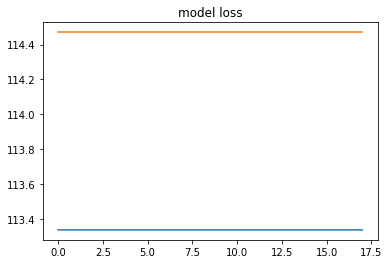

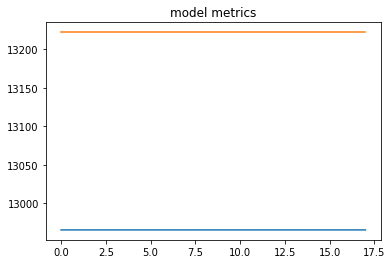

In [200]:
metok = len(list(history.history.keys()))//2

plt.plot(history.history[list(history.history.keys())[0]])
plt.plot(history.history[list(history.history.keys())[metok]])
plt.title('model loss')
plt.show()
for i in range(metok-1):
  plt.plot(history.history[list(history.history.keys())[i+1]])
  plt.plot(history.history[list(history.history.keys())[i+1+metok]])
  plt.title('model metrics')
  plt.show()

In [201]:
from keras.models import load_model
model = load_model('model_fx.h5')

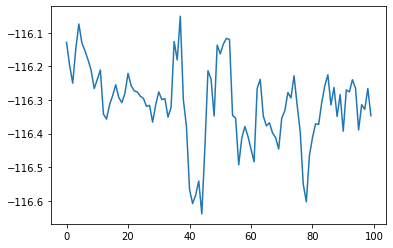

In [202]:
ttt = 100
val_predict = model.predict(X_val[ttt:ttt+massiv_blok])
val_original = Y_val[ttt:ttt+massiv_blok]
plt.plot(val_predict[:,0] - val_original)

In [203]:
val_predict

array([[-1.7580993],
       [-1.7580993],
       [-1.7580993],
       [-1.7580993],
       [-1.7580993],
       [-1.7580993],
       [-1.7580993],
       [-1.7580993],
       [-1.7580993],
       [-1.7580993],
       [-1.7580993],
       [-1.7580993],
       [-1.7580993],
       [-1.7580993],
       [-1.7580993],
       [-1.7580993],
       [-1.7580993],
       [-1.7580993],
       [-1.7580993],
       [-1.7580993],
       [-1.7580993],
       [-1.7580993],
       [-1.7580993],
       [-1.7580993],
       [-1.7580993],
       [-1.7580993],
       [-1.7580993],
       [-1.7580993],
       [-1.7580993],
       [-1.7580993],
       [-1.7580993],
       [-1.7580993],
       [-1.7580993],
       [-1.7580993],
       [-1.7580993],
       [-1.7580993],
       [-1.7580993],
       [-1.7580993],
       [-1.7580993],
       [-1.7580993],
       [-1.7580993],
       [-1.7580993],
       [-1.7580993],
       [-1.7580993],
       [-1.7580993],
       [-1.7580993],
       [-1.7580993],
       [-1.75